In [ ]:
from src.flow_segmenter.segmenter import SegmenterKraken, SegmenterYOLO
from lxml import etree

# Test Kraken

In [ ]:
segmenter = SegmenterKraken()

In [ ]:
page = segmenter.segment(image="./p027.jpg")

In [ ]:
print(etree.tostring(page, pretty_print=True, encoding="unicode"))

In [ ]:
from kraken import serialization, blla
from kraken.kraken import SEGMENTATION_DEFAULT_MODEL
from kraken.lib import vgsl
from kraken.lib.segmentation import (
		calculate_polygonal_environment,
		polygonal_reading_order,
)
from PIL import Image
from shapely.geometry import Polygon, LineString
import numpy as np

In [ ]:
img = Image.open('p027.jpg')

xml_page_seg = blla.segment(
		img,
		model=[vgsl.TorchVGSLModel.load_model(SEGMENTATION_DEFAULT_MODEL)],
)

In [ ]:
lines = []
for baseline in xml_page_seg.lines:
		baseline_coords = baseline.baseline
		mask = calculate_polygonal_environment(img, baselines=[baseline_coords])
		baseline.boundary = mask[0]
		if baseline.boundary is None:
				print("No boundary found for baseline, skipping...")
				print(baseline)
				continue
		lines.append(baseline)

In [ ]:
xml_page_seg.lines = lines
polygonal_list = [
		{"tags": bl.tags, "baseline": bl.baseline, "boundary": list(bl.boundary)}
		for bl in xml_page_seg.lines
]

In [ ]:
[Polygon(r.boundary) for r in xml_page_seg.regions['text']]

In [ ]:
print(polygonal_list[0])

In [ ]:
from IPython.display import display
from PIL import Image
from PIL import ImageDraw

image = Image.open(image)
draw = ImageDraw.Draw(image)

polygonal_list = [
		{"tags": bl.tags, "baseline": bl.baseline, "boundary": list(bl.boundary)}
		for bl in xml_page_seg.lines
]

for polygon in polygonal_list:
		draw.line(polygon['baseline'], fill="red", width=2)
		if polygon['boundary'] is not None:
				draw.polygon([(x,y) for x,y in polygon['boundary']], outline="blue", fill=None, width=2)
for polygon in [Polygon(r.boundary) for r in xml_page_seg.regions['text']]:
		draw.polygon(polygon.exterior.coords, outline="green", fill=None, width=5)
from IPython.display import display

display(image)

# Test Yolo

In [29]:
segmenter = SegmenterYOLO(
	model_names=["Riksarkivet/yolov9-regions-1", "Riksarkivet/yolov9-lines-within-regions-1"],
	order_lines=True,
)


In [30]:
page = segmenter.segment(image="./p027.jpg")

YOLO: Running inference (batch size 2): 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


In [31]:
print(etree.tostring(page, pretty_print=True, encoding="unicode"))

<PcGts xmlns="http://schema.primaresearch.org/PAGE/gts/pagecontent/2019-07-15" xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" xsi:schemaLocation="http://schema.primaresearch.org/PAGE/gts/pagecontent/2019-07-15 http://schema.primaresearch.org/PAGE/gts/pagecontent/2019-07-15/pagecontent.xsd">
  <Metadata>
    <Creator>ai@riksarkivet.se</Creator>
    <Created>2025-05-27T14:17:42.055904</Created>
    <LastChange>2025-05-27T14:17:42.055904</LastChange>
  </Metadata>
  <Page imageFilename="p027.jpg" imageWidth="2479" imageHeight="3508">
    <ReadingOrder>
      <OrderedGroup id="ro">
        <OrderedGroupIndexed id="ro_p027_node0" index="0">
          <OrderedGroupIndexed id="ro_p027_node0_node0" index="0">
            </OrderedGroupIndexed>
          <OrderedGroupIndexed id="ro_p027_node0_node1" index="1">
            </OrderedGroupIndexed>
          <OrderedGroupIndexed id="ro_p027_node0_node2" index="2">
            </OrderedGroupIndexed>
          <OrderedGroupIndexed id="ro_p027_

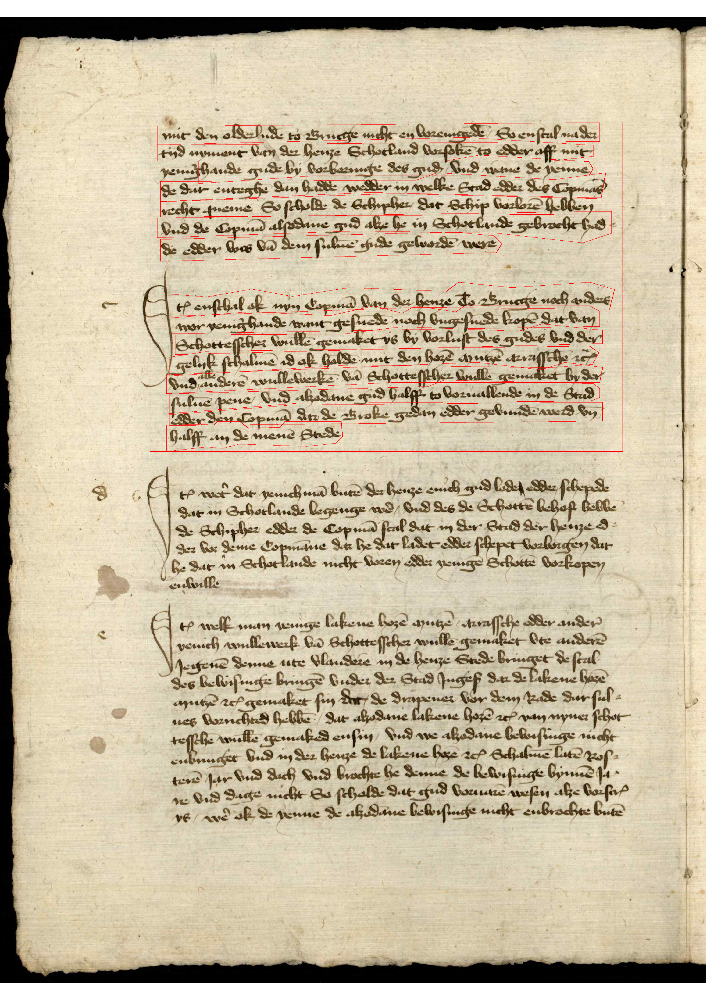

In [32]:
from IPython.display import display
from PIL import Image
from PIL import ImageDraw
from shapely.geometry import Polygon

image = Image.open('p027.jpg')
draw = ImageDraw.Draw(image)
for coords in page.findall(f".//Coords", namespaces=page.nsmap):
		draw.polygon([(int(c.split(',')[0]), int(c.split(',')[1])) for c in coords.get("points").split()], outline="red", fill=None, width=2)

from IPython.display import display

display(image)